In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sys
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, HTML
from plotly.subplots import make_subplots
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_scor
from PIL import Image
sys.path.append(r'C:\Users\mostafa\AI&ML\File-important')

# Import the remove_outliers_iqr function
from outliers import remove_outliers_iqr




In [3]:
image_path = r"A.jpg"

display(HTML(f'<div style="text-align: center;margin-top:20px"><img src="{image_path}" style="max-width: 100%; height: auto;" /></div>'))


In [4]:
pd.set_option('display.max_colwidth', None)
df=pd.read_csv('CF.csv')
exp=pd.read_csv('Column_Descriptions_Brca.csv')
exp

,Column Name,Description
0,x.radius_mean,Mean radius of the tumor
1,x.texture_mean,Mean texture of the tumor
2,x.perimeter_mean,Mean perimeter of the tumor
3,x.area_mean,Mean area of the tumor
4,x.smoothness_mean,Mean smoothness of the tumor
5,x.compactness_mean,Mean compactness of the tumor
6,x.concavity_mean,Mean concavity of the tumor
7,x.concave_pts_mean,Mean number of concave points on the tumor
8,x.symmetry_mean,Mean symmetry of the tumor
9,x.fractal_dim_mean,Mean fractal dimension of the tumor


# ***EDA***

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 609 entries, 0 to 608
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           609 non-null    int64  
 1   x.radius_mean        609 non-null    float64
 2   x.texture_mean       609 non-null    float64
 3   x.perimeter_mean     609 non-null    float64
 4   x.area_mean          609 non-null    float64
 5   x.smoothness_mean    609 non-null    float64
 6   x.compactness_mean   609 non-null    float64
 7   x.concavity_mean     609 non-null    float64
 8   x.concave_pts_mean   609 non-null    float64
 9   x.symmetry_mean      609 non-null    float64
 10  x.fractal_dim_mean   609 non-null    float64
 11  x.radius_se          609 non-null    float64
 12  x.texture_se         609 non-null    float64
 13  x.perimeter_se       608 non-null    float64
 14  x.area_se            609 non-null    float64
 15  x.smoothness_se      601 non-null    flo

In [6]:
df.head()

,Unnamed: 0,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,y
0,1,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,0.1885,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,B
1,2,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,0.1967,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,B
2,3,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,0.1815,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,B
3,4,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,0.1467,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,B
4,5,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,...,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,B


In [7]:
df.tail()

,Unnamed: 0,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,y
604,229,12.960,18.29,84.18,525.2,0.07351,0.07899,0.04057,0.018830,0.1874,...,24.61,96.31,621.9,0.09329,0.23180,0.16040,0.06608,0.3207,0.07247,B
605,253,12.720,17.67,80.98,501.3,0.07896,0.04522,0.01402,0.018350,0.1459,...,20.96,88.87,586.8,0.10680,0.09605,0.03469,0.03612,0.2165,0.06025,B
606,441,17.680,20.74,117.40,963.7,0.11150,0.16650,0.18550,0.105400,0.1971,...,25.11,132.90,1302.0,0.14180,0.34980,0.35830,0.15150,0.2463,0.07738,M
607,5,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,...,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,B
608,314,14.810,14.70,94.66,680.7,0.08472,0.05016,0.03416,0.025410,0.1659,...,17.58,101.70,760.2,0.11390,0.10110,0.11010,0.07955,0.2334,0.06142,B


In [8]:
df.sample(5)

,Unnamed: 0,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,y
516,517,25.730,17.46,174.20,2010.0,0.11490,0.23630,0.33680,0.19130,0.1956,...,23.58,229.30,3234.0,0.1530,0.59370,0.6451,0.27560,0.3690,0.08815,M
331,332,11.690,24.44,76.37,406.4,0.12360,0.15520,0.04515,0.04531,0.2131,...,32.19,86.12,487.7,0.1768,0.32510,0.1395,0.13080,0.2803,0.09970,B
502,503,11.760,18.14,75.00,431.1,0.09968,0.05914,0.02685,0.03515,0.1619,...,23.39,85.10,553.6,0.1137,0.07974,0.0612,0.07160,0.1978,0.06915,M
442,443,19.590,18.15,130.70,1214.0,0.11200,0.16660,0.25080,0.12860,0.2027,...,26.39,174.90,2232.0,0.1438,0.38460,0.6810,0.22470,0.3643,0.09223,M
37,38,9.876,19.40,63.95,298.3,0.10050,0.09697,0.06154,0.03029,0.1945,...,26.83,72.22,361.2,0.1559,0.23020,0.2644,0.09749,0.2622,0.08490,B


In [9]:
df.columns

Index(['Unnamed: 0', 'x.radius_mean', 'x.texture_mean', 'x.perimeter_mean',
       'x.area_mean', 'x.smoothness_mean', 'x.compactness_mean',
       'x.concavity_mean', 'x.concave_pts_mean', 'x.symmetry_mean',
       'x.fractal_dim_mean', 'x.radius_se', 'x.texture_se', 'x.perimeter_se',
       'x.area_se', 'x.smoothness_se', 'x.compactness_se', 'x.concavity_se',
       'x.concave_pts_se', 'x.symmetry_se', 'x.fractal_dim_se',
       'x.radius_worst', 'x.texture_worst', 'x.perimeter_worst',
       'x.area_worst', 'x.smoothness_worst', 'x.compactness_worst',
       'x.concavity_worst', 'x.concave_pts_worst', 'x.symmetry_worst',
       'x.fractal_dim_worst', 'y'],
      dtype='object')

In [10]:
df.shape

(609, 32)

In [11]:
df.size

19488

In [12]:
df.isna().sum()

Unnamed: 0             0
x.radius_mean          0
x.texture_mean         0
x.perimeter_mean       0
x.area_mean            0
x.smoothness_mean      0
x.compactness_mean     0
x.concavity_mean       0
x.concave_pts_mean     0
x.symmetry_mean        0
x.fractal_dim_mean     0
x.radius_se            0
x.texture_se           0
x.perimeter_se         1
x.area_se              0
x.smoothness_se        8
x.compactness_se       8
x.concavity_se         8
x.concave_pts_se       8
x.symmetry_se          8
x.fractal_dim_se       0
x.radius_worst         0
x.texture_worst        0
x.perimeter_worst      0
x.area_worst           0
x.smoothness_worst     0
x.compactness_worst    0
x.concavity_worst      0
x.concave_pts_worst    0
x.symmetry_worst       0
x.fractal_dim_worst    0
y                      0
dtype: int64

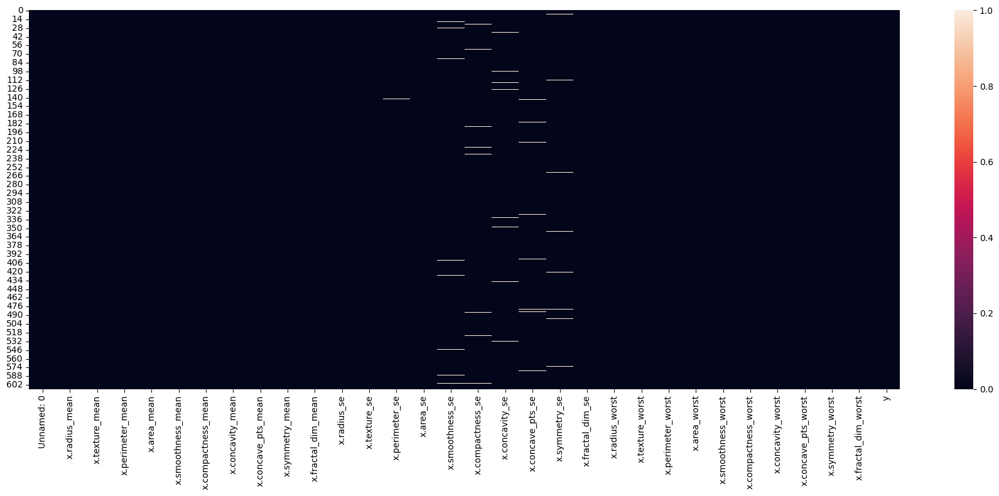

In [13]:
plt.figure(figsize=(18,8))
sns.heatmap(df.isna())
plt.tight_layout()

In [14]:
df[df.duplicated()]

,Unnamed: 0,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,y
275,276,11.600,18.36,73.88,412.7,0.08508,0.05855,0.03367,0.017770,0.1516,...,24.02,82.68,495.1,0.13420,0.18080,0.18600,0.08288,0.3210,0.07863,B
276,277,13.170,18.22,84.28,537.3,0.07466,0.05994,0.04859,0.028700,0.1454,...,23.89,95.10,687.6,0.12820,0.19650,0.18760,0.10450,0.2235,0.06925,B
277,278,13.240,20.13,86.87,542.9,0.08284,0.12230,0.10100,0.028330,0.1601,...,25.50,115.00,733.5,0.12010,0.56460,0.65560,0.13570,0.2845,0.12490,B
278,279,13.140,20.74,85.98,536.9,0.08675,0.10890,0.10850,0.035100,0.1562,...,25.46,100.90,689.1,0.13510,0.35490,0.45040,0.11810,0.2563,0.08174,B
279,280,9.668,18.10,61.06,286.3,0.08311,0.05428,0.01479,0.005769,0.1680,...,24.62,71.11,380.2,0.13880,0.12550,0.06409,0.02500,0.3057,0.07875,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604,229,12.960,18.29,84.18,525.2,0.07351,0.07899,0.04057,0.018830,0.1874,...,24.61,96.31,621.9,0.09329,0.23180,0.16040,0.06608,0.3207,0.07247,B
605,253,12.720,17.67,80.98,501.3,0.07896,0.04522,0.01402,0.018350,0.1459,...,20.96,88.87,586.8,0.10680,0.09605,0.03469,0.03612,0.2165,0.06025,B
606,441,17.680,20.74,117.40,963.7,0.11150,0.16650,0.18550,0.105400,0.1971,...,25.11,132.90,1302.0,0.14180,0.34980,0.35830,0.15150,0.2463,0.07738,M
607,5,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,...,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,B


In [15]:
df.duplicated().sum()

93

# PreProcessing
  - **cleaning & Outliers**
  - **Preparation & Transformation**
  

In [16]:
df.drop(columns=['Unnamed: 0'],inplace=True)

In [17]:
df['y'].value_counts()

y
B    384
M    224
0      1
Name: count, dtype: int64

In [18]:
df=df.drop(df.loc[df['y']=='0'].index,axis=0)

In [19]:
df['y'] = df['y'].map({'B': 0, 'M': 1}) 

In [20]:
df.drop_duplicates(inplace=True)

In [21]:
Stat_desc=df[['x.concavity_se','x.concave_pts_se','x.symmetry_se','x.compactness_se','x.smoothness_se']].describe()

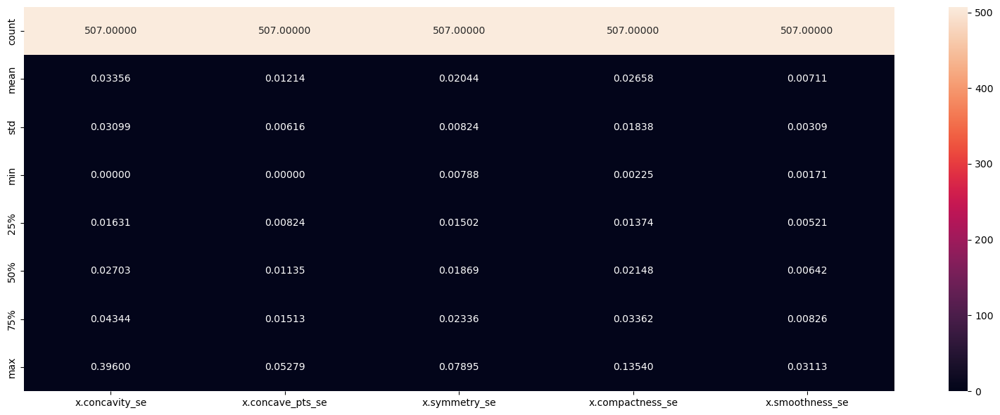

In [22]:
plt.figure(figsize=(16,6))
sns.heatmap(Stat_desc,annot=True,fmt='.5f')
plt.tight_layout()

In [23]:
df['x.concavity_se'].fillna(df['x.concavity_se'].mean(), inplace=True)
df['x.concave_pts_se'].fillna(df['x.concave_pts_se'].mean(), inplace=True)
df['x.symmetry_se'].fillna(df['x.symmetry_se'].mean(), inplace=True)
df['x.compactness_se'].fillna(df['x.compactness_se'].mean(), inplace=True)
df['x.smoothness_se'].fillna(df['x.smoothness_se'].mean(), inplace=True)
df['x.perimeter_se'].fillna(df['x.perimeter_se'].mean(), inplace=True)

C:\Users\mostafa\AppData\Local\Temp\ipykernel_18112\796056061.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['x.concavity_se'].fillna(df['x.concavity_se'].mean(), inplace=True)
C:\Users\mostafa\AppData\Local\Temp\ipykernel_18112\796056061.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

# Normalization

In [24]:

# Assuming 'df' is your original DataFrame
df_new_scaled = df.copy()  # Create a copy of your DataFrame and assign it to df_new_scaled

# Identify columns with values >= 1
columns_to_normalize = df_new_scaled.columns[df_new_scaled.max() >= 1]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Normalize the selected columns
df_new_scaled[columns_to_normalize] = scaler.fit_transform(df_new_scaled[columns_to_normalize])

df_new_scaled.head()

,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,x.fractal_dim_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,y
0,0.025033,0.017934,0.193908,0.179343,0.000168,0.000230,0.000248,0.000178,0.000307,0.000029,...,0.192964,0.245480,0.129276,0.14400,0.145540,0.190895,0.12880,0.2977,0.07259,0.0
1,0.023277,0.023140,0.185782,0.159703,0.000204,0.000400,0.000170,0.000116,0.000337,0.000067,...,0.225746,0.227501,0.109443,0.13120,0.242852,0.150958,0.07283,0.3184,0.08183,0.0
2,0.009629,0.010529,0.073487,0.055313,0.000185,0.000169,0.000110,0.000077,0.000281,0.000071,...,0.097015,0.073310,0.031877,0.13240,0.084903,0.070823,0.06227,0.2450,0.07773,0.0
3,0.023086,0.033592,0.172372,0.161315,0.000138,0.000068,0.000095,0.000109,0.000151,0.000032,...,0.287580,0.169580,0.088650,0.09701,0.018337,0.038602,0.05013,0.1987,0.06169,0.0
4,0.004637,0.027498,0.035167,0.024772,0.000124,0.000149,0.000059,0.000022,0.000264,0.000056,...,0.264925,0.034115,0.014009,0.12970,0.105180,0.054952,0.02564,0.3105,0.07409,0.0


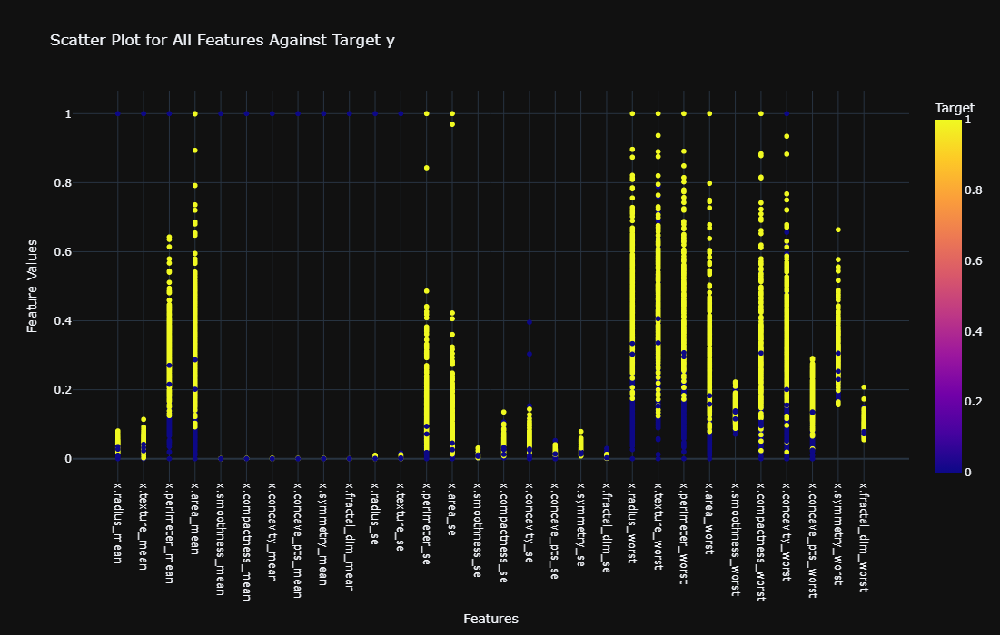

In [25]:

# Melt the DataFrame to prepare it for plotting
df_melted = df_new_scaled.melt(id_vars='y', var_name="Feature", value_name="Value")

# Create a scatter plot
fig = px.scatter(
    df_melted,
    x="Feature",
    y="Value",
    color="y",
    title="Scatter Plot for All Features Against Target y",
    template="plotly_dark",
    color_discrete_map={0: 'blue', 1: 'red'},
    labels={"y": "Target", "Value": "Feature Values"}
)

# Customize layout
fig.update_layout(
    width=1200,
    height=700,
    xaxis=dict(tickangle=90),
    font=dict(size=12),
    yaxis_title="Feature Values",
    xaxis_title="Features"
)

# Show the plot
fig.show()


# Detecting Outliers Using Z-score

In [26]:
# Compute  for numerical columns
z_scores = df_new_scaled.select_dtypes(include=['float64', 'int64']).apply(zscore)

# Count the number of outliers (Z-score > 3 or < -3)
outliers = (z_scores.abs() > 3).sum()

# Print the number of outliers for each feature
print("Number of Outliers Per Feature:")
print(outliers)


Number of Outliers Per Feature:
x.radius_mean           1
x.texture_mean          1
x.perimeter_mean        5
x.area_mean             6
x.smoothness_mean       1
x.compactness_mean      1
x.concavity_mean        1
x.concave_pts_mean      1
x.symmetry_mean         1
x.fractal_dim_mean      1
x.radius_se             1
x.texture_se            1
x.perimeter_se          8
x.area_se               5
x.smoothness_se         6
x.compactness_se       12
x.concavity_se          6
x.concave_pts_se        5
x.symmetry_se          11
x.fractal_dim_se        9
x.radius_worst          4
x.texture_worst         4
x.perimeter_worst       4
x.area_worst            8
x.smoothness_worst      3
x.compactness_worst     9
x.concavity_worst       5
x.concave_pts_worst     0
x.symmetry_worst        8
x.fractal_dim_worst     6
y                       0
dtype: int64


# Let's Remove Outliers

In [27]:
# Calculate Q1, Q3, and IQR for each column
Q1 = df_new_scaled.quantile(0.25)
Q3 = df_new_scaled.quantile(0.75)
IQR = Q3 - Q1

# Filter out rows that contain outliers in any column
df_no_outliers = df_new_scaled[~((df_new_scaled < (Q1 - 1.5 * IQR)) | (df_new_scaled > (Q3 + 1.5 * IQR))).any(axis=1)]


# Let's Check After Cleaning!

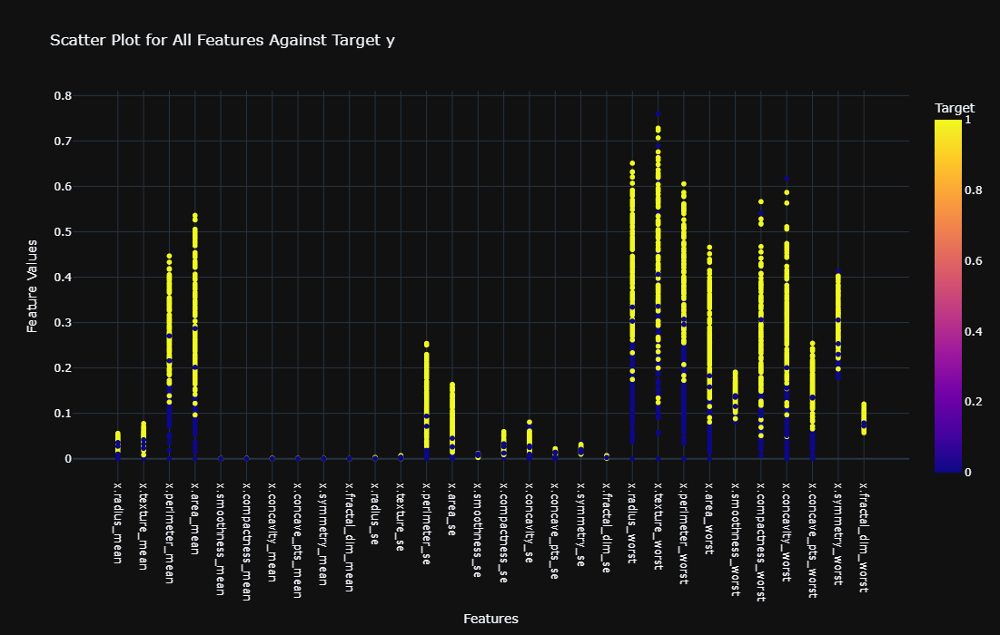

In [28]:

# Melt the DataFrame to prepare it for plotting
df_melted = df_no_outliers.melt(id_vars='y', var_name="Feature", value_name="Value")

# Create a scatter plot
fig = px.scatter(
    df_melted,
    x="Feature",
    y="Value",
    color="y",
    title="Scatter Plot for All Features Against Target y",
    template="plotly_dark",
    color_discrete_map={0: 'blue', 1: 'red'},
    labels={"y": "Target", "Value": "Feature Values"}
)

# Customize layout
fig.update_layout(
    width=1200,
    height=700,
    xaxis=dict(tickangle=90),
    font=dict(size=12),
    yaxis_title="Feature Values",
    xaxis_title="Features"
)

# Show the plot
fig.show()


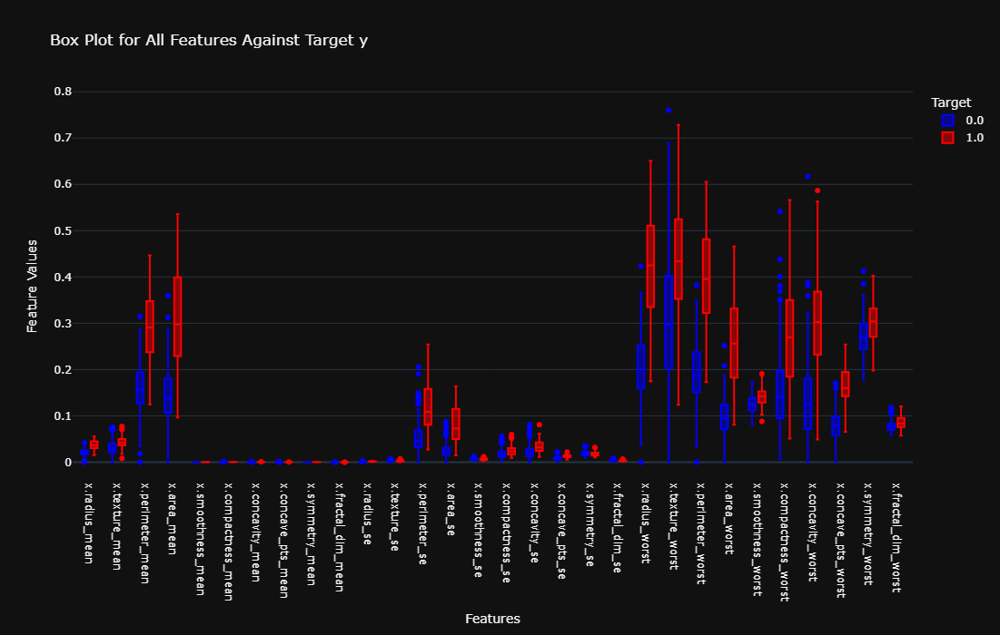

In [29]:
# Melt the DataFrame to prepare it for plotting
df_melted = df_no_outliers.melt(id_vars='y', var_name="Feature", value_name="Value")

# Create a box plot
fig = px.box(
    df_melted,
    x="Feature",
    y="Value",
    color="y",
    title="Box Plot for All Features Against Target y",
    template="plotly_dark",
    color_discrete_map={0: 'blue', 1: 'red'},
    labels={"y": "Target", "Value": "Feature Values"}
)

# Customize layout
fig.update_layout(
    width=1200,
    height=700,
    xaxis=dict(tickangle=90),
    font=dict(size=12),
    yaxis_title="Feature Values",
    xaxis_title="Features"
)

# Show the plot
fig.show()


In [30]:
corr=pd.DataFrame(df_no_outliers.corr()['y'])
corr.head()

,y
x.radius_mean,0.714979
x.texture_mean,0.366889
x.perimeter_mean,0.727321
x.area_mean,0.723430
x.smoothness_mean,0.288487


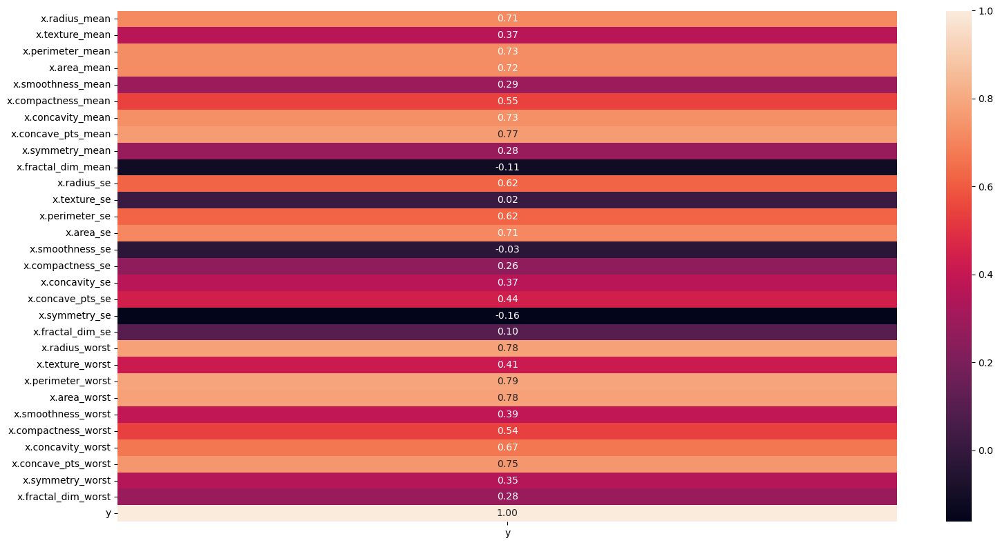

In [31]:
plt.figure(figsize=(16,8))
sns.heatmap(corr,annot=True,fmt='.2f')
plt.tight_layout()

In [32]:
columns_to_drop = [
    'x.smoothness_mean', 'x.compactness_mean', 'x.concavity_mean', 
    'x.concave_pts_mean', 'x.symmetry_mean', 'x.fractal_dim_mean',
    'x.radius_se', 'x.texture_se','x.smoothness_se','x.symmetry_se'
]
df_clean = df_no_outliers.drop(columns=columns_to_drop, errors='ignore').reset_index(drop=True)


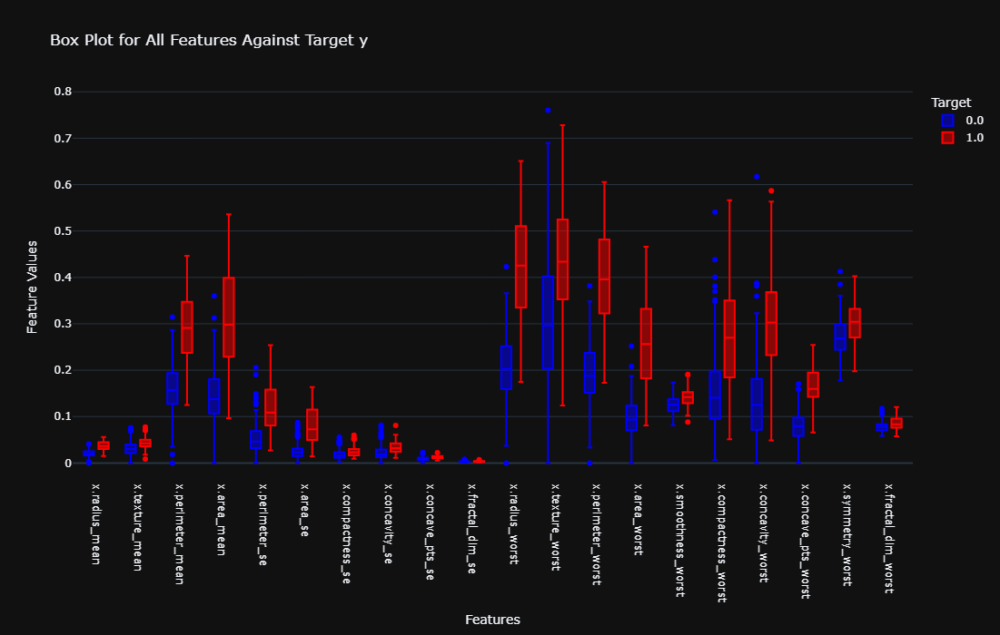

In [33]:
# Melt the DataFrame to prepare it for plotting
df_melted = df_clean.melt(id_vars='y', var_name="Feature", value_name="Value")

# Create a box plot
fig = px.box(
    df_melted,
    x="Feature",
    y="Value",
    color="y",
    title="Box Plot for All Features Against Target y",
    template="plotly_dark",
    color_discrete_map={0: 'blue', 1: 'red'},
    labels={"y": "Target", "Value": "Feature Values"}
)

# Customize layout
fig.update_layout(
    width=1200,
    height=700,
    xaxis=dict(tickangle=90),
    font=dict(size=12),
    yaxis_title="Feature Values",
    xaxis_title="Features"
)

# Show the plot
fig.show()


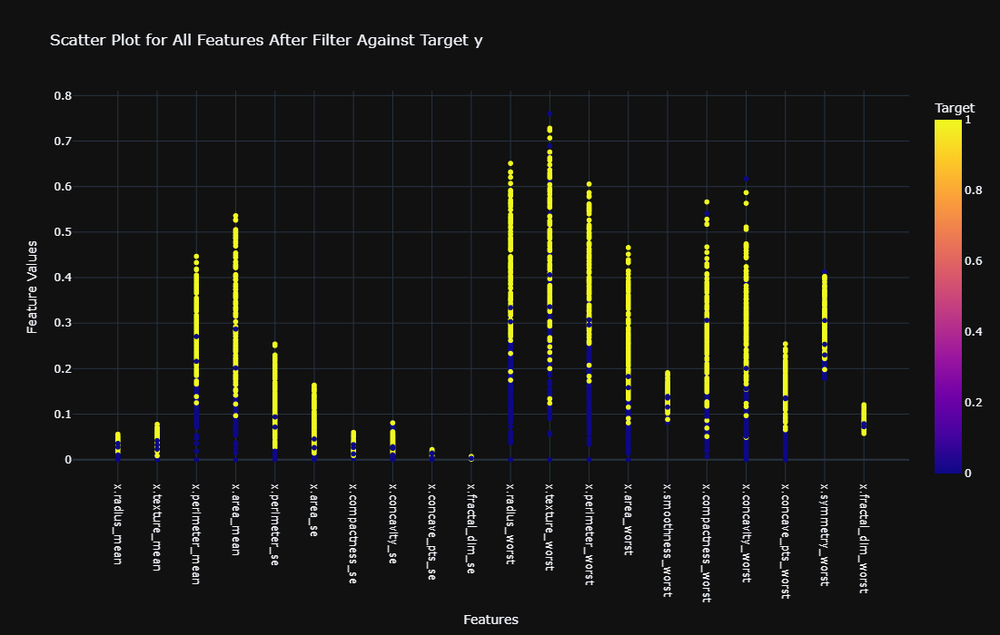

In [34]:

# Melt the DataFrame to prepare it for plotting
df_melted = df_clean.melt(id_vars='y', var_name="Feature", value_name="Value")

# Create a scatter plot
fig = px.scatter(
    df_melted,
    x="Feature",
    y="Value",
    color="y",
    title="Scatter Plot for All Features After Filter Against Target y",
    template="plotly_dark",
    color_discrete_map={0: 'blue', 1: 'red'},
    labels={"y": "Target", "Value": "Feature Values"}
)

# Customize layout
fig.update_layout(
    width=1200,
    height=700,
    xaxis=dict(tickangle=90),
    font=dict(size=12),
    yaxis_title="Feature Values",
    xaxis_title="Features"
)

# Show the plot
fig.show()


In [35]:
df_clean['y'].value_counts()

y
0.0    245
1.0    116
Name: count, dtype: int64

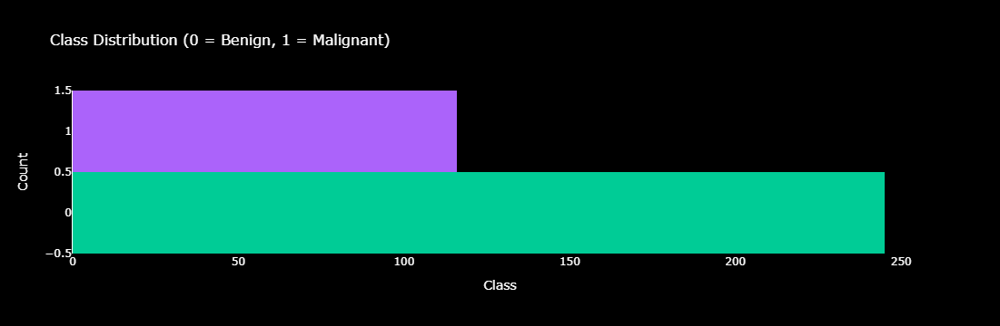

In [36]:
fig = px.histogram(df_clean, 
                   y='y', 
                   color='y', 
                   color_discrete_map={'0': 'green', '1': 'red'},
                   title="Class Distribution (0 = Benign, 1 = Malignant)")

fig.update_layout(
    plot_bgcolor='black',  # Black background for plot
    paper_bgcolor='black',  # Black background for figure
    font=dict(color='white'),  # White text
    xaxis=dict(title='Class', tickfont=dict(color='white'), titlefont=dict(color='white')),
    yaxis=dict(title='Count', tickfont=dict(color='white'), titlefont=dict(color='white')),
    title=dict(font=dict(size=16, color='white')),
    showlegend=False  # Remove legend if unnecessary
)

# Remove grid lines
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

# Show the plot
fig.show()


In [37]:
corr_new=pd.DataFrame(df_clean.corr()['y'])

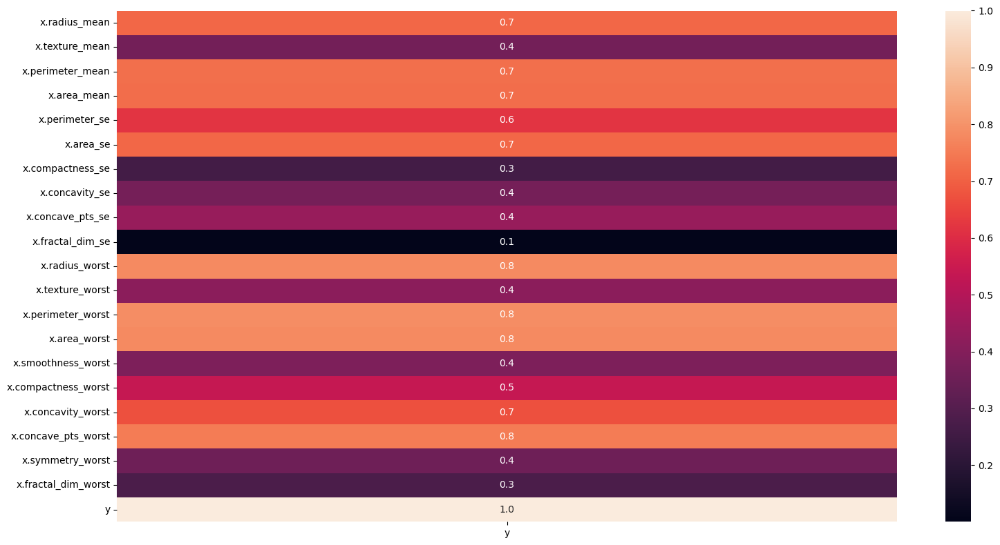

In [38]:
plt.figure(figsize=(16,8))
sns.heatmap(corr_new,annot=True,fmt='.1f')
plt.tight_layout()

In [43]:
correlation_matrix = df_clean.corr()['y']

# Extract correlations with the target variable
correlations_with_target = correlation_matrix

# Get the 6 features with the highest absolute correlation values
top_features = correlations_with_target.abs().sort_values(ascending=False).head(6)

print("Top 6 features with the highest correlation with the target:")
print(top_features)

# If needed, extract only these features from the dataset
selected_features = df_clean[top_features.index]


Top 6 features with the highest correlation with the target:
y                      1.000000
x.perimeter_worst      0.789120
x.area_worst           0.781795
x.radius_worst         0.780863
x.concave_pts_worst    0.753671
x.perimeter_mean       0.727321
Name: y, dtype: float64


# Let's Modeling


In [44]:
selected_features = [
    'x.perimeter_worst',
    'x.area_worst',
    'x.radius_worst',
    'x.concave_pts_worst',
    'x.perimeter_mean'
]
X = df_clean[selected_features]
y = df_clean['y']

# Step 2: Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Initialize Random Forest with basic parameters
rf = RandomForestClassifier(random_state=42)

# Step 4: Use GridSearchCV for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],            # Number of trees
    'max_depth': [None, 10, 20, 30],          # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],          # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],            # Minimum samples required at a leaf node
    'max_features': ['sqrt', 'log2']          # Number of features to consider at each split
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Step 5: Fit the model to the training data
grid_search.fit(X_train, y_train)

# Step 6: Get the best hyperparameters and train the final model
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

# Initialize Random Forest with the best parameters
rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X_train, y_train)

# Step 7: Evaluate the model on the test set
y_pred = rf_best.predict(X_test)

# Print evaluation metrics
print("Accuracy on test set:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Step 8: Perform Cross-Validation to ensure robustness
cv_scores = cross_val_score(rf_best, X, y, cv=5, scoring='accuracy')
print("Cross-validation Accuracy Scores:", cv_scores)
print("Mean Cross-validation Accuracy:", cv_scores.mean())


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
Accuracy on test set: 0.9452054794520548
Confusion Matrix:
 [[50  2]
 [ 2 19]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.96      0.96        52
         1.0       0.90      0.90      0.90        21

    accuracy                           0.95        73
   macro avg       0.93      0.93      0.93        73
weighted avg       0.95      0.95      0.95        73

Cross-validation Accuracy Scores: [0.90410959 0.88888889 0.94444444 0.95833333 0.95833333]
Mean Cross-validation Accuracy: 0.9308219178082192


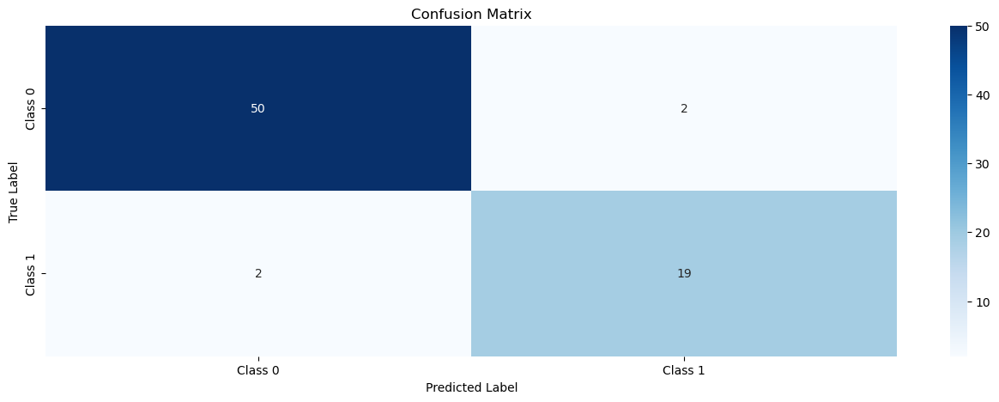

<Figure size 640x480 with 0 Axes>

In [50]:
cm = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
plt.figure(figsize=(16, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
plt.tight_layout()

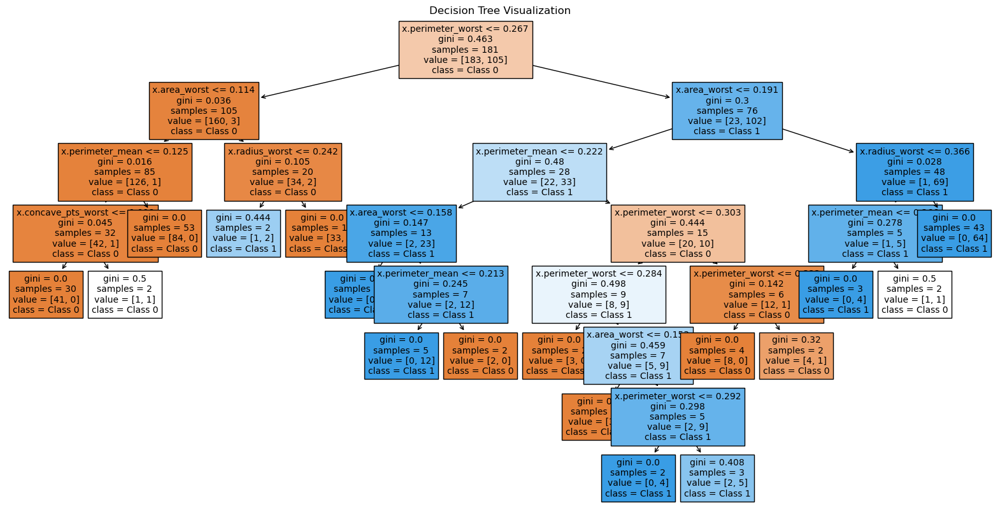

In [48]:
plt.figure(figsize=(20, 10))
tree_to_plot = rf_best.estimators_[0]  # Get the first tree
plot_tree(tree_to_plot, feature_names=selected_features, class_names=['Class 0', 'Class 1'], filled=True, fontsize=10)
plt.title('Decision Tree Visualization')
plt.show()


In [45]:

# Training set evaluation
y_train_pred = rf_best.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training set:", train_accuracy)

# Testing set evaluation
y_test_pred = rf_best.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on testing set:", test_accuracy)

# Compare the accuracies
if train_accuracy - test_accuracy > 0.05:  # Difference threshold (5%)
    print("Warning: Overfitting detected (large gap between training and testing accuracy).")
else:
    print("No significant overfitting detected.")


Accuracy on training set: 0.9791666666666666
Accuracy on testing set: 0.9452054794520548
No significant overfitting detected.
